# <center>Digital Image Processing - Problem Set 5</center>

### Student Names: Luis David Díaz - Jessied Marriaga - Juan Camilo Gómez

In [3]:
# Libraries needed for appropiate working of the functions developed.
import cv2
import numpy as np
import matplotlib.pyplot as plt
from os import listdir, path
import json
import random
%matplotlib inline

images_carnames = sorted(listdir('cars/'))    #Por facilidad de trabajo de todas las imagenes se guardaron los nombres de los archivos
#contenidos en el directorio especificado 
print sorted(images_carnames)
print len(images_carnames)

['image_0001.jpg', 'image_0002.jpg', 'image_0003.jpg', 'image_0004.jpg', 'image_0005.jpg', 'image_0006.jpg', 'image_0007.jpg', 'image_0008.jpg', 'image_0009.jpg', 'image_0010.jpg', 'image_0011.jpg', 'image_0012.jpg', 'image_0013.jpg', 'image_0014.jpg', 'image_0015.jpg', 'image_0016.jpg', 'image_0017.jpg', 'image_0018.jpg', 'image_0019.jpg', 'image_0020.jpg']
20


### Problem 1

Write a function that describes <i>each</i> object in a binary image using the Hu statistical moments. The Hu moments are invariant to rotation, scale and translation. These moments can be defined for <i>each</i> region in a binary image. The OpenCV function to compute these moments is <tt>cv2.HuMoments</tt>. Write down the equations that compute the seven Hu moments for a region.

Momentos de Hu de la imagen horizontal:  [  1.89674691e-03   7.08680437e-07   1.28044453e-12   5.26162081e-12
   6.44434359e-24   1.43234107e-15  -1.20410904e-23]
Momentos de Hu de la imagen vertical  :  [  1.89674691e-03   7.08680437e-07   1.28044453e-12   5.26162081e-12
   6.44434359e-24   1.43234107e-15  -1.20410904e-23]


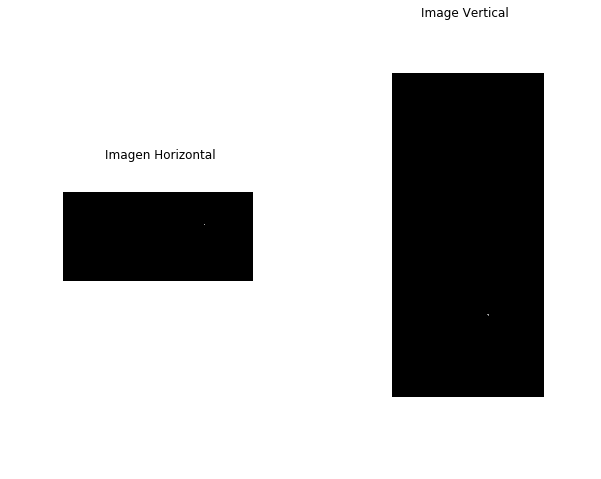

In [4]:
#Define function
def HuMoments(image):
    HM=cv2.HuMoments(cv2.moments(image)).flatten() #Find the Hu moments
    return HM

image0 = cv2.imread('recH.png',0)#Load Image
image1 = cv2.imread('recV.png',0)#Load Image
HuM0=HuMoments(image0)#Call function
HuM1=HuMoments(image1)#Call function
print 'Momentos de Hu de la imagen horizontal: ',HuM0 
print 'Momentos de Hu de la imagen vertical  : ',HuM1
plt.figure(figsize=(10,10));
plt.subplot(1,2,1); plt.imshow(image0, cmap = 'gray');plt.title('Imagen Horizontal');plt.axis('off') #Display the image
plt.subplot(1,2,2); plt.imshow(image1, cmap = 'gray');plt.title('Image Vertical');plt.axis('off') #Display the image
plt.show()



<h3>- Descripción de la función desarrollada:</h3>    
<p style="text-align:justify">Para el desarrollo de este problema 1 se desarrolló la función HuMoments(), la cual recibe como parámetro de entrada una imagen binaria y retorna un vector con los momentos de Hu.</p>

<h3>- Descripción de las funciones de librerías utilizadas:</h3>
<p style="text-align:justify">Con el propósito de desarrollar este inciso se utilizó la librería OPENCV a través de la cual se ejecutaron distintas funciones. Una de estas fue moments() la cual recibe una imagen como parámetro de entrada y calcula todos los momentos hasta el tercer orden de un polígono o forma rasterizada. También se utilizó la función HuMoments() para calcular los siete invariantes momentos de Hu, para realizar esto la función recibe como parámetro los momentos calculados con moments().</p>
<p style="text-align:justify">Se empleó la función imread() la cual lee una imagen cualquiera y recibe dos parámetros: La ruta donde se encuentra la imagen y un indicador que especifica el tipo de color de la imagen cargada. Y se utilizó la función imshow() para mostrar las imágenes.</p>

<h3>- Análisis de resultados:</h3>
<p style="text-align:justify">Los momentos de Hu son un conjunto de siete descriptores invariantes a rotación, escala y traslación que cuantifican la forma de un objeto, donde los siete momentos se computan como:
$$hu[0]=η_{20}+η_{02}$$
$$hu[1]=(η_{20}-η_{02})^2+4η_{11}^2$$
$$hu[2]=(η_{30}-3η_{12})^2+(3η_{21}-η_{03})^2$$
$$hu[3]=(η_{30}+η_{12})^2+(η_{21}+η_{03})^2$$
$$hu[4]=(η_{30}-3η_{12})(η_{30}+η_{12})[(η_{30}+η_{12})^2-3(η_{21}+η_{03})^2]+(3η_{21}-η_{03})(η_{21}+η_{03})[3(η_{30}-η_{12})^2-(η_{21}+η_{03})^2$$
$$hu[5]=(η_{20}-η_{02})[(η_{30}+η_{12})^2-(η_{21}+η_{03})^2]+4η_{11}(η_{30}+η_{12})(η_{21}+η_{03})$$
$$hu[6]=(3η_{21}-η_{03})(η_{21}+η_{03})[3(η_{30}+η_{12})^2-(η_{21}+η_{03})^2]-(η_{30}-3η_{12})(η_{21}+η_{03})[3(η_{30}+η_{12})^2-(η_{21}+η_{03})^2]$$</p>
<p style="text-align:justify">Con la función desarrollada se observan los valores numéricos de los momentos de Hu. Se nota que a pesar de rotar la imagen estos valores son los mismos puesto que como ya se había mencionado los momentos de Hu no cambian con la rotación, escala o traslación.</p>

### Problem 2

Write a function that detects corners on an image using the Harris corner detection method. You can use the OpenCV built-in functions. Your function should output the $N$ detected corner locations in a $2 \times N$ matrix. Visualize your results by plotting the corners on top of the input image.  Apply your function to the binary image <tt> shapes.png</tt> and to the grayscale image <tt>face.tif</tt>.

Saving N_corners's localization of  shapes.PNG in file localization_ncorners_1.json


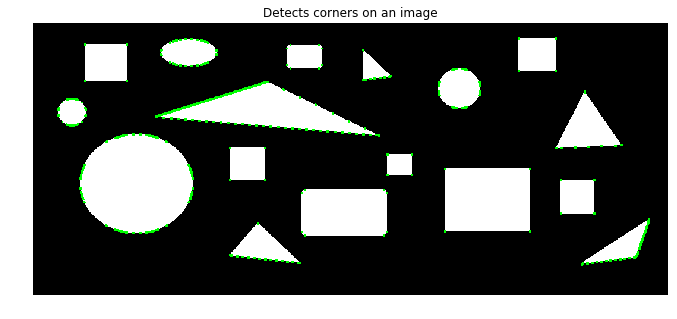

Saving N_corners's localization of  cubo.png in file localization_ncorners_2.json


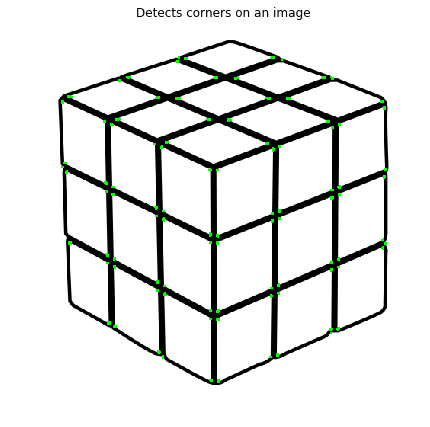

In [5]:
def HarrisCorner(img):
    height, width = img.shape[:2]   
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) #Converts an image from one color space to another
    gray = np.float32(gray) #Input image of type float32
    cH = cv2.cornerHarris(gray,2,3,0.04)#Detects corners using the Harris corner detection method
    cH_d = cv2.dilate(cH,None)#Result is dilated for marking the corners
    img[cH_d>0.01*cH.max()]=[0,255,0] # Threshold for an optimal value
    coorX=[] #Create vector for the X coordinates of location of the corners
    coorY=[] #Create vector for the Y coordinates of location of the corners
    for i in range(height):       #Go over every row
        for j in range(width):    #Go over every column
            if np.any(img[i,j]==[0,255,0]):
                coorX.append(i) #Vector for the X coordinates of location of the corners
                coorY.append(j) #Vector for the Y coordinates of location of the corners
    #Create output matrix of corner locations
    lon=len(coorX)
    array=np.zeros((2,lon))
    for k in range(array.shape[1]):
        array[0][k]=coorX[k]
        array[1][k]=coorY[k]
    return img,array

#Display the image with the corners on top of the input image and save the corner locations
images_names = ['shapes.PNG','cubo.png']
for i in range(len(images_names)):
    imag = cv2.imread(images_names[i])
    Hc,coor = HarrisCorner(imag)
    print("Saving N_corners's localization of  "+str(images_names[i])+" in file "+"localization_ncorners_"+str(i+1)+".json")
    fl = open("localizacion_ncorners_"+str(i+1)+".json","w")
    localiz = {"X Coordinates":coor[0][0:coor.shape[1]].tolist(),"Y Coordinates":coor[1][0:coor.shape[1]].tolist()}
    json.dump(localiz,fl,sort_keys=True,indent=4)
    fl.close()
    if(i==0):
        fs = (25,25)
    else:
        fs = (15,15)
    plt.figure(figsize=fs);
    plt.subplot(1,2,1);plt.imshow(Hc, cmap = 'gray');plt.title('Detects corners on an image');plt.axis('off') 
    plt.show()

<h3>- Descripción de la función desarrollada:</h3>    
<p style="text-align:justify">Para el desarrollo de este inciso se realizó la función HarrisCorner() que detecta esquinas en una imagen usando el método de detección de la esquina de Harris. Esta función recibe como parámetro de entrada una imagen y retorna una imagen con las esquinas en la parte superior de la imagen de entrada y una matriz $2 \times N$ con las localizaciones de las  $N$ esquinas detectadas. La imagen es mostrada en pantalla y las localizaciones se guardan en un archivo json para una mejor visualización de estas coordenadas. </p>

<h3>- Descripción de las funciones de librerías utilizadas:</h3>
<p style="text-align:justify">Para desarrollar este inciso se utilizó la librería OPENCV a través de la cual se ejecutaron distintas funciones. La primera función empleada fue cvtColor() para convertir la imagen de entrada de un espacio de color a otro, luego se empleó el detector de borde Harris cornerHarris() el cual recibe cuatro parámetros de entrada: una imagen, debe ser en escala de grises y tipo float32 por eso se convierte la imagen de entrada en un array Numpy de tipo np.float32,el segundo parámetro es el tamaño del barrio considerado para la detección de esquinas, el tercero es el parámetro de apertura del derivado de Sobel utilizado y finalmente el parámetro libre de detector Harris en la ecuación. Con la modificación de los tres últimos parámetros se destacan las esquinas que se desean destacar de la imagen. El resultado de función cornerHarris() se dilata con la función dilate() para marcar las esquinas.</p>
<p style="text-align:justify">Finalmente, se empleó la función imread() la cual lee una imagen cualquiera y la función imshow() para mostrar las imágenes.</p>


### Problem 3

A company that bottles a variety of industrial chemicals has heard
of your success solving imaging problems and hires you to design an approach
for detecting when bottles are not full. The bottles appear as shown below
as they move along a conveyor line past an automatic
filling and capping station. A bottle is considered imperfectly filled when the
level of the liquid is below the midway point between the bottom of the neck and
the shoulder of the bottle.The shoulder is defined as the region of the bottle
where the sides and slanted portion of the bottle intersect. The bottles are
moving, but the company has an imaging system equipped with an illumination
flash front end that effectively stops motion, so you will be given images that
look very close to the sample shown below.

<img src="files/bottles.png" />

Propose a solution for detecting
bottles that are not filled properly. State clearly all assumptions that you
make and that are likely to impact the solution you propose. Implement your
solution and apply it to the images <tt>bottles.tif, new_bottles.jpg</tt> and <tt> three_bottles.jpg</tt>. Visualize the results
of your algorithm by highlighting with false colors
the regions that are detected as correctly
filled bottles and the regions that are detected as not properly filled bottles.

Numero de contornos  5
Numero de contornos  5
Numero de contornos  5


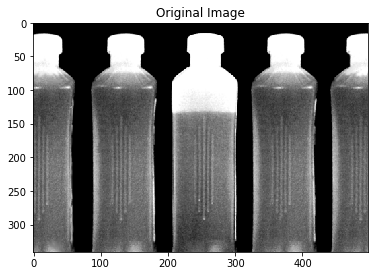

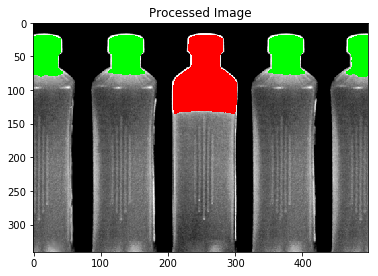

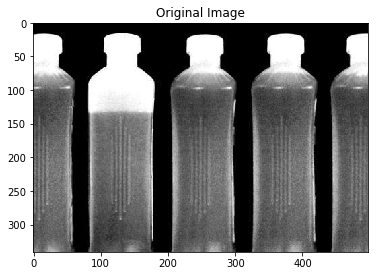

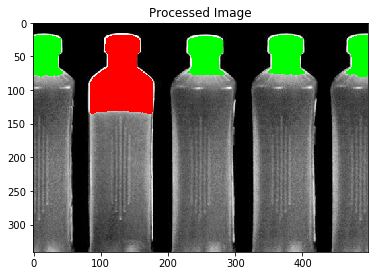

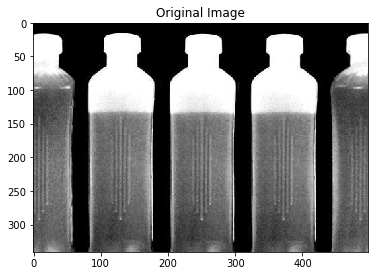

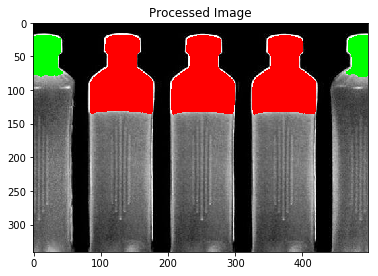

In [25]:
def bottledetect(img):
    blur = cv2.blur(img, (6, 6)) #Apply averaging filter
    ret, img2 = cv2.threshold(blur,200,255,cv2.THRESH_BINARY) #Apply thresholding to the blurred image
    image,contours, hierarchy = cv2.findContours(img2,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE) #Find the contours of binary image
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR) #Convert to BGR for false coloring
    print "Numero de contornos ", len(contours) #Number of contours/bottles detected
    for c in contours:
        if(cv2.contourArea(c) > 3000): #If area of empty space in bottle is bigger than 3000
            cv2.drawContours(img, [c], -1, (255,0,0), thickness=-1) #Apply red color. Is not properly filled
        else:
            cv2.drawContours(img, [c], -1, (0,255,0), thickness=-1) #Else, apply green color. It is properly filled
    return img

imag = cv2.imread("bottles.png", cv2.IMREAD_GRAYSCALE) #Read image in grayscale
imag2 = bottledetect(imag) #Call function
plt.figure(figsize=(6,6)); plt.imshow(imag, cmap='gray'); plt.title("Original Image") #Plot images
plt.figure(figsize=(6,6)); plt.imshow(imag2, cmap='gray'); plt.title("Processed Image")

imag = cv2.imread("new_bottles.jpg", cv2.IMREAD_GRAYSCALE) #Read image in grayscale
imag2 = bottledetect(imag) #Call function
plt.figure(figsize=(6,6)); plt.imshow(imag, cmap='gray'); plt.title("Original Image") #Plot images
plt.figure(figsize=(6,6)); plt.imshow(imag2, cmap='gray'); plt.title("Processed Image")

imag = cv2.imread("three_bottles.jpg", cv2.IMREAD_GRAYSCALE) #Read image in grayscale
imag2 = bottledetect(imag) #Call function
plt.figure(figsize=(6,6)); plt.imshow(imag, cmap='gray'); plt.title("Original Image") #Plot images
plt.figure(figsize=(6,6)); plt.imshow(imag2, cmap='gray'); plt.title("Processed Image")

<h3>- Descripción de la función desarrollada:</h3>   
<p style="text-align:justify">
La función desarrollada en este inciso, bottledetect(), recibe como parámetro de entrada cualquiera de las tres imágenes mencionadas en el enunciado y retorna la misma imagen pero marcando con color rojo las áreas incorrectamente llenadas en las botellas. Las áreas correctamente llenadas son marcadas con color verde.</p>

<h3>- Descripción de las funciones de librerías utilizadas:</h3>
<p style="text-align:justify">
Para poder detectar las botellas que estuvieran mal llenadas, se decidió medir el área de las regiones no llenadas en cada botella y si este valor resulta mayor que cierto umbral, se etiqueta la botella como mal llenada. Para poder llegar a este resultado, fue necesario primero aplicar thresholding a la imagen original con el objetivo de obtener una imagen binaria en la que las áreas no llenadas de las botellas se mostraran en color blanco. Esto se logro con la función threshold() de la librería OpenCV, que permite especificar, entre otras cosas, el valor a partir del cual un píxel se dibujara como blanco en la imagen binaria resultante. Este valor fue elegido a partir de la experimentación, con la que se concluyo que una intensidad de 200 daba resultados satisfactorios. Sin embargo, ya que en la imagen hay bordes y otros puntos blancos que se comportan como ruido a la hora de aplicar thresholding, se aplico un filtro promediante de tamaño 6x6 usando la función blur() de la librería OpenCV, que recibe como parámetros de entrada la imagen y el tamaño del filtro. Se escogió el tamaño mencionado puesto que fue el menor tamaño que garantizaba obtener un numero de componentes conexas igual al numero de botellas tras binarizar la imagen. </p>
<p style="text-align:justify">
Una vez obtenida la imagen binaria con numero de componentes conexas igual al numero de botellas, se obtienen y separan estas componentes utilizando la función findContours() de OpenCV. Con esta función se obtiene un vector de vectores donde cada uno de estos vectores contiene los pixeles pertenecientes a las componentes conexas detectadas. OpenCV tiene funciones que permiten analizar las componentes conexas a partir del resultado anterior. Una de ellas es contourArea(), que recibe como entrada un vector con los pixeles de la componente y retorna un valor proporcional al área de la componente ingresada. Experimentalmente, se observo que las botellas correctamente llenadas arrojan valores oscilando entre 2500 y 2700, nunca pasando de 3000. Por tanto, si una componente conexa arroja un valor de área mayor a 3000, se cataloga la botella relacionada como mal llenada.</p>
<p style="text-align:justify">
Finalmente, para el falso coloreado se utilizo la función drawContours(). Esta función recibe como parámetros de entrada la imagen, la componente que se va a colorear, y el color. Verificando los valores del área para cada componente, se colorean de rojo las componentes con valores mayores a 3000 y de verde las que tengan valores menores.</p>

### Problem 4

Suppose that you are observing objects in the night sky. Suppose that only ‘big’ objects are important to your observation. In this scenario, ‘small’ objects are considered noise. Write a python function that processes the image as follows:

1. Use a 15x15 averaging filter to blur the image.

2. Apply a threshold of 0.25 to binarize the resulting blurred image.

3. Use the binary image to ‘mask’ the noise of the original image: simply perform an element-wise multiplication of the binary image and the original image.

4. Use connected component analysis on the binary image to count the number of ‘big’ objects found.

The function should take three inputs: an image matrix, the size of the averaging filter and threshold value. Make sure your function displays the intermediary results of each step outlined above.

Apply your function to the input image ‘hubble-original.tif’. Try different values of smoothing kernel size and threshold value. Analyze the relationship between number of objects found and smoothing kernel size and threshold value. In particular, you might want to observe the result when using an averaging filter of size n=1 (i.e. no smoothing).

Numero de contornos  28
Numero de contornos  452
Numero de contornos  10
Numero de contornos  9


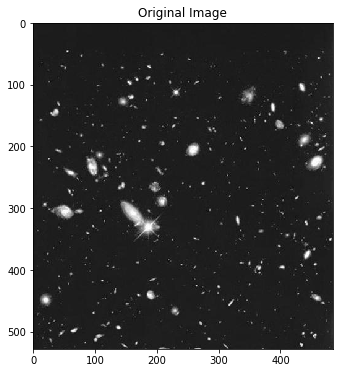

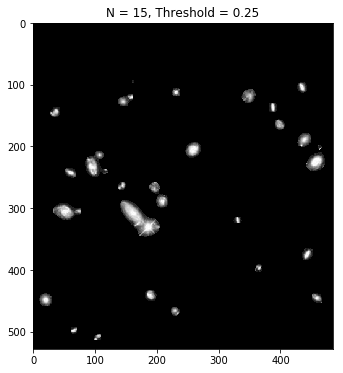

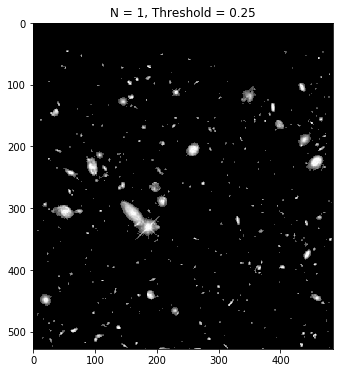

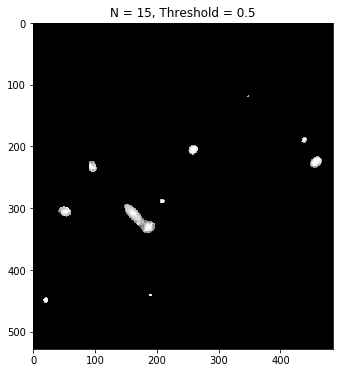

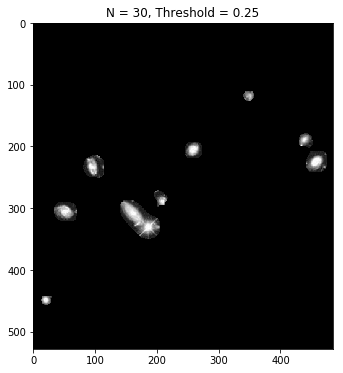

In [6]:
#Define function
def nightfilter(img, N, val):
    img = cv2.normalize(img,img,alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F) #Convert the image to float ranging from 0-1
    blur = cv2.blur(img, (N, N)) #Apply the averaging filter of size NxN
    ret, img2 = cv2.threshold(blur,val,1,cv2.THRESH_BINARY) #Threshold the image with the input value as threshold
    img3 = img*img2 #Multiply the binary image and the original image
    img2 = cv2.normalize(img2,img2, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U) #Convert back to 0-255
    image,contours, hierarchy = cv2.findContours(img2,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE) #Find the number of big objects detected
    print "Numero de contornos ", len(contours) #Print the value
    return img3

imag = cv2.imread("hubble-original.tif", cv2.IMREAD_GRAYSCALE) #Read image in grayscale
imag2 = nightfilter(imag, 15, 0.25) #Call function
plt.figure(figsize=(6,6)); plt.imshow(imag, cmap='gray'); plt.title("Original Image") #Plot the images
plt.figure(figsize=(6,6)); plt.imshow(imag2, cmap='gray'); plt.title("N = 15, Threshold = 0.25")

imag2 = nightfilter(imag, 1, 0.25) #Call function
plt.figure(figsize=(6,6)); plt.imshow(imag2, cmap='gray'); plt.title("N = 1, Threshold = 0.25")

imag2 = nightfilter(imag, 15, 0.5) #Call function
plt.figure(figsize=(6,6)); plt.imshow(imag2, cmap='gray'); plt.title("N = 15, Threshold = 0.5")

imag2 = nightfilter(imag, 30, 0.25) #Call function
plt.figure(figsize=(6,6)); plt.imshow(imag2, cmap='gray'); plt.title("N = 30, Threshold = 0.25")

<h3> - Descripción de la función desarrollada:</h3> 
<p style="text-align:justify">
En este inciso se desarrollo la función nightfilter(). Esta función recibe como parámetros una imagen, un tamaño para un filtro y un umbral para thresholding. Retorna la imagen ingresada tras haber pasado por los procedimientos descritos en el enunciado.</p>

<h3>- Descripción de las funciones de librerías utilizadas:</h3> 
<p style="text-align:justify">
Ya que se utilizarán valores entre 0 y 1 como umbrales para el proceso de thresholding, lo primero que se requiere hacer es convertir la imagen desde el rango de intensidad de 0 a 255 al rango de 0 a 1. Esto se logra con la función de OpenCV, normalize(), usada en anteriores entregas. Esta función permite convertir una imagen desde un rango al otro especificando el valor máximo, el valor mínimo y el tipo de dato que contendrá la imagen, si serán valores enteros (CV_8U) o decimales (CV_32F). Tras haberse normalizado la imagen, se le aplica un filtro promediante usando la función blur(), a la cual se le debe especificar el tamaño del filtro. Este es uno de los parámetros de entrada de la función nightfilter() por lo que se utiliza ese valor. Seguidamente se utiliza la función threshold() de OpenCV al resultado obtenido anteriormente para conseguir una imagen binarizada, indicando como umbral el valor ingresado a nightfilter().</p>
<p style="text-align:justify">
Una vez conseguida la imagen binarizada, se multiplica con la imagen original de manera que solo los pixeles pertenecientes a las componentes conexas de la imagen binaria mantengan sus valores mientras que los valores de los demás pixeles sean igualados a cero. El resultado de esta multiplicación es la imagen que retorna la función nightfilter(). Finalmente se le aplica la función findContours() a la imagen binaria. Esta función retorna un vector de vectores en el que cada vector contiene los pixeles de una componente conexa distinta. Solo es de interés saber cuantos vectores contiene el resultado de la función pues este numero es igual al numero de componentes de la imagen binaria. <p>
<h3>- Análisis de los resultados:</h3> 
<p style="text-align:justify">
Tras aplicar la función a la imagen con los valores indicados en el enunciado, queda claro que al aplicarse el filtro promediante y dado que los elementos se encuentran sobre un fondo negro, muchos pixeles reducen en gran medida sus valores de intensidad. Si los elementos son pequeños, el efecto es mas grande por la acción promediante. Es por lo anterior que, cuando se aplica la a la imagen, muchos elementos de la imagen original desaparecen. Si se cambia el tamaño del filtro por uno igual a 1, el resultado cambia dramáticamente, manteniéndose casi todos los elementos de la imagen original. </p>
<p style="text-align:justify">
Si se mantiene un parámetro fijo y se incrementa el otro, se observa que al aumentar cualquiera de los dos parámetros, el numero de componentes que permanece en la imagen tras la multiplicación se reduce. Sin embargo, la visualización de estos componentes varia según el parámetro que se aumento. En caso de aumentar el umbral, no solo las componentes se reducen sino que se vuelven mas pequeñas, ya que los pixeles con intensidad mas alta se encuentran en el interior. En caso de aumentar el tamaño del filtro, aunque el numero de componentes es menor, los tamaños no se recortan siguiendo la silueta de los pixeles con intensidad mas alta sino que muestran formas irregulares y con valores de intensidad muy diferentes en sus bordes.</p>
<p style="text-align:justify">
En caso de disminuir los valores de umbral y del tamaño del filtro, se aumenta el numero de componentes en la imagen final, como era de esperarse. Es de destacar que como el fondo de la imagen original no es puramente negro, al reducirse el umbral a valores cercanos a la intensidad promedio del fondo, tramos de este son detectados como componentes y permanecen en la imagen final, incluso sin estar cerca de algún componente que contenga elementos con valores de intensidad altos.</p>

### Problem 5

Write a function that extracts local interest points and computes
their descriptors using the SIFT transform. You can find implementations of
the SIFT transform in OpenCV.


Your function should return two matrices: A first matrix of size $3 \times N$, where $N$ is the number of detected points in the image, and the 3 elements correspond to the $x$, $y$ locations and $s$ size of the detected points. A second matrix of size $128 \times N$ that contains the SIFT descriptor of each interest point.

Apply your function to all car images <tt>image_00XX.jpg</tt>.
Store the results of each image in a separate data file.

Interest Points and SIFT descriptors for image 1 extracted and saved in file: data_image_car_1.json
Interest Points and SIFT descriptors for image 2 extracted and saved in file: data_image_car_2.json
Interest Points and SIFT descriptors for image 3 extracted and saved in file: data_image_car_3.json
Interest Points and SIFT descriptors for image 4 extracted and saved in file: data_image_car_4.json
Interest Points and SIFT descriptors for image 5 extracted and saved in file: data_image_car_5.json
Interest Points and SIFT descriptors for image 6 extracted and saved in file: data_image_car_6.json
Interest Points and SIFT descriptors for image 7 extracted and saved in file: data_image_car_7.json
Interest Points and SIFT descriptors for image 8 extracted and saved in file: data_image_car_8.json
Interest Points and SIFT descriptors for image 9 extracted and saved in file: data_image_car_9.json
Interest Points and SIFT descriptors for image 10 extracted and saved in file: data_image_car_10.jso

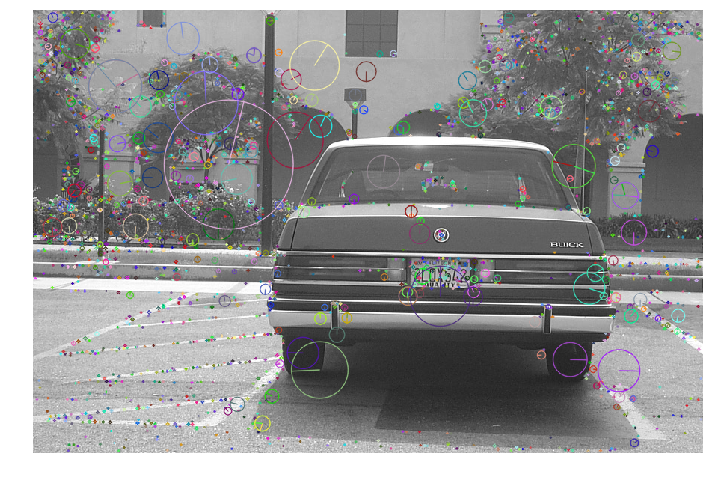

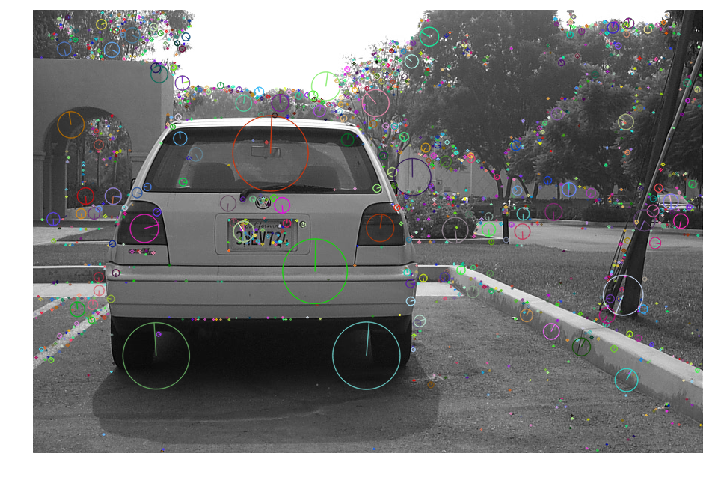

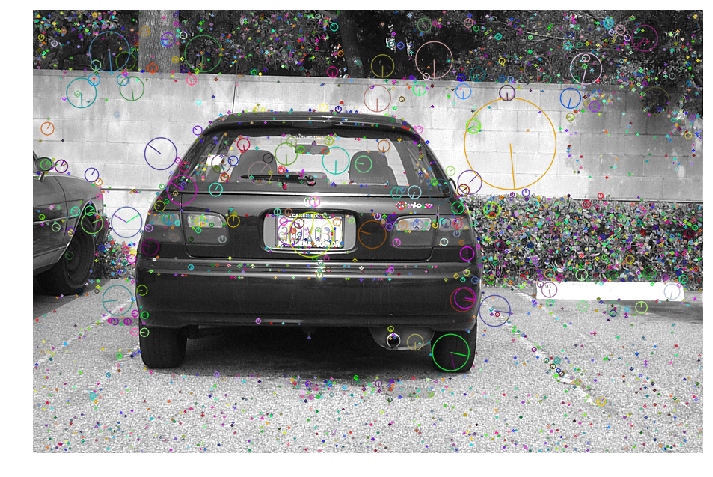

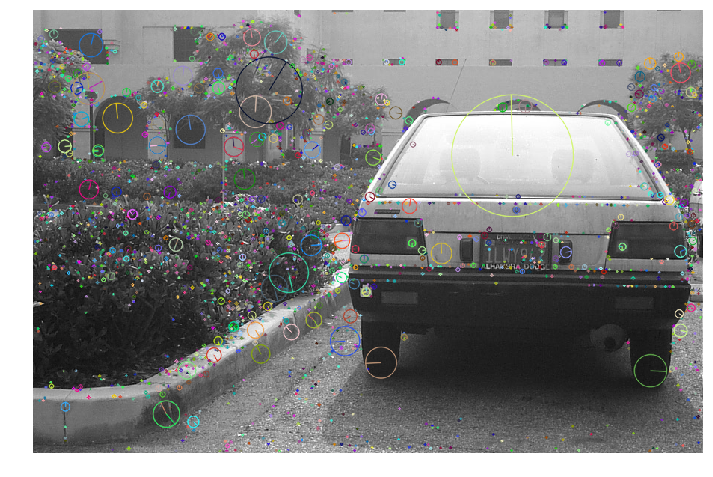

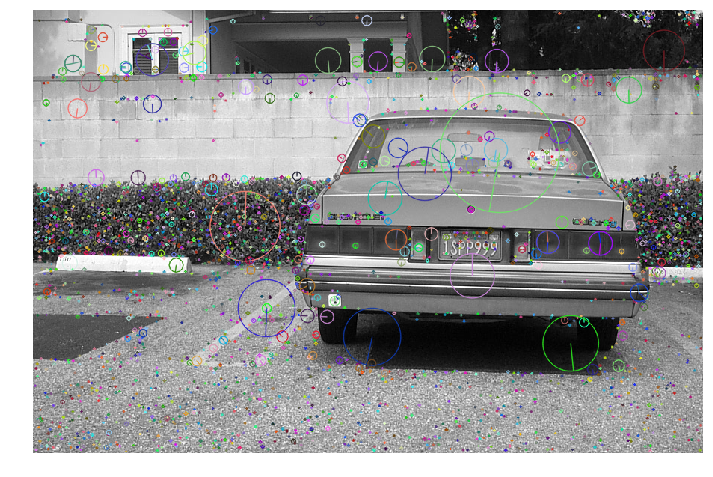

...

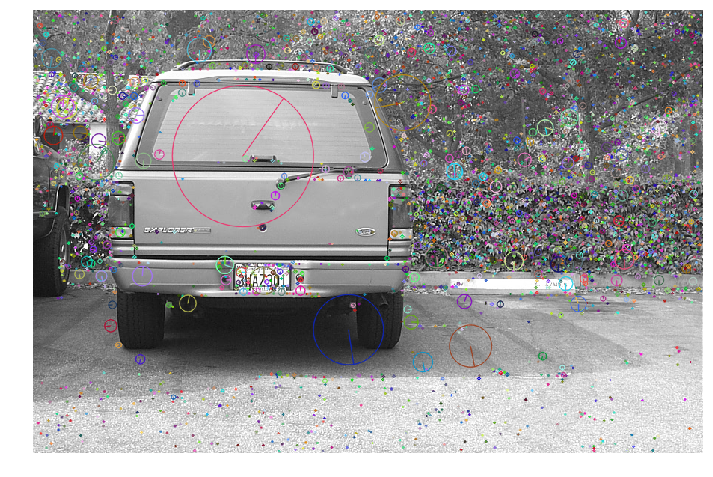

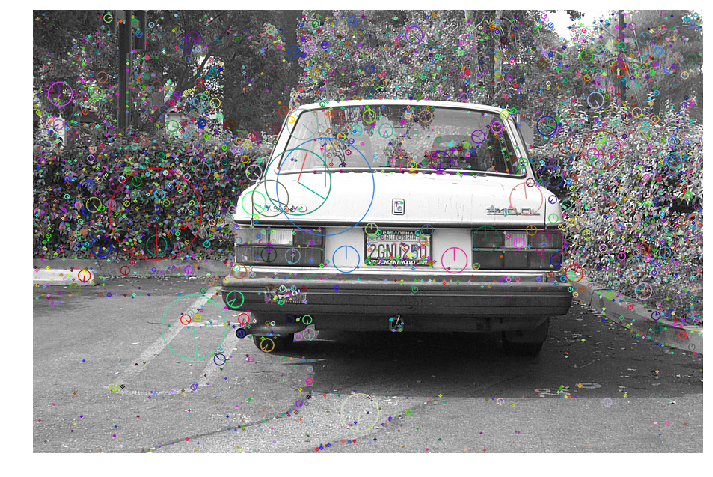

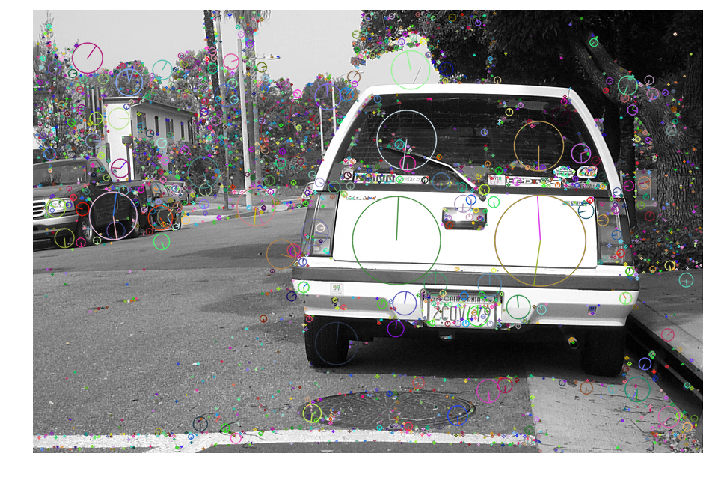

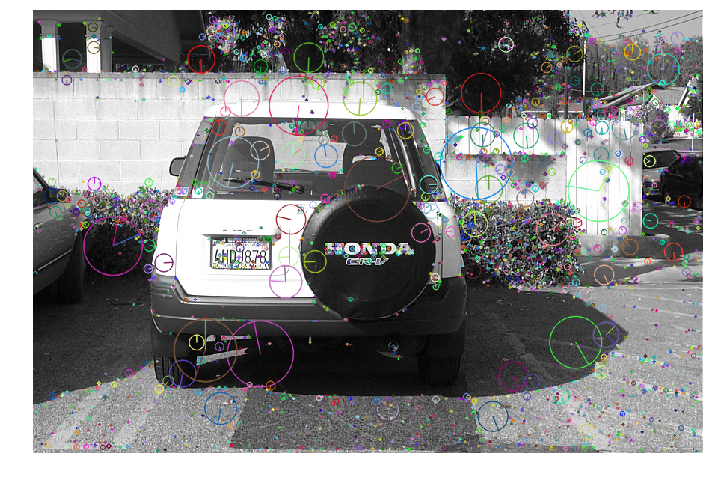

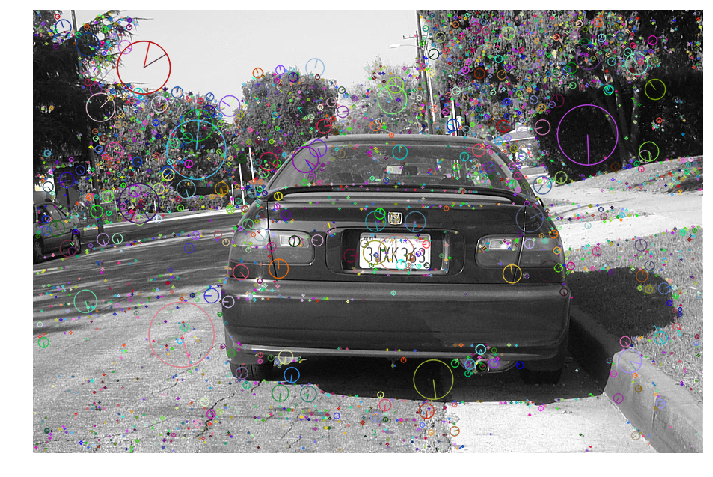

In [7]:
#Define function

def getlipcompdes(src,f=0):
    gray= cv2.cvtColor(src,cv2.COLOR_BGR2GRAY)
    if((cv2.__version__)[0]=='3'):
        sift = cv2.xfeatures2d.SIFT_create()#Construct a SIFT object
        
    else:
        sift = cv2.SIFT()
    kp, Des = sift.detectAndCompute(gray,None) #Detect keypoints 
    #Define matrix of size 3xN 
    N = len(kp)
    dpoints = np.zeros((3,N))
    for i in range(N):
        dpoints[0][i] = kp[i].pt[0]
        dpoints[1][i] = kp[i].pt[1]
        dpoints[2][i] = kp[i].size
    if(f==1):
        img_wf = gray.copy()
        img_wf = cv2.drawKeypoints(gray,kp,img_wf,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        plt.figure(figsize=(12,12))
        plt.imshow(img_wf);plt.axis('off');
    return dpoints,Des
for i in range(len(images_carnames)):
    src = cv2.imread('cars/'+images_carnames[i])
    keyp,Dp = getlipcompdes(src,f=1)
    fle = open("data_image_car_"+str(i+1)+".json","w")
    data = {
        "points":keyp.tolist(),"Descriptors": Dp.tolist()}
    json.dump(data,fle, sort_keys=True, indent=4)
    fle.close()
    print "Interest Points and SIFT descriptors for image "+str(i+1)+" extracted and saved in file: data_image_car_"+str(i+1)+".json"

    



<h3>- Descripción de la función desarrollada:</h3>    
<p style="text-align:justify">Para el desarrollo de este problema se desarrolló la función getlipcompdes(). Esta función recibe como parámetro de entrada una imagen y una bandera que indica si se desea graficar la imagen procesada. Esta función retorna  dos matrices de tamaños 3xN y 128xN respectivamente, donde la primera matriz contiene las coordenadas (x,y) y los tamaños del conjunto de puntos de intereses en la imagen y la otra matriz el conjunto de descriptores de la misma.</p>

<h3>- Descripción de las funciones de librerías utilizadas:</h3>
<p style="text-align:justify">Con el propósito de desarrollar este inciso se utilizó la librería OPENCV a través de la cual se ejecutaron distintas funciones. La primera función utilizada fue xfeatures2d.SIFT_create() la cual construye el objeto SIFT. Además de esta función, se utilizó el método detectAndCompute(), el cual recibe como parámetro de entrada una imagen a la cual se le desean encontrar los puntos claves y adicionalmente calcula sus descriptores. </p>
<p style="text-align:justify">Por otro lado, se utilizó la función drawKeypoints() la cual recibe como parámetros de entrada: una imagen en escala de grises, que en este caso corresponde a la imagen a la cual se le desea extraer los puntos claves, los puntos claves detectados, la imagen de salida y una bandera que corresponde a la configuración que tendrá el dibujo de los puntos claves en la imagen.</p>
